In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
from IPython.display import display, Markdown

import sys
sys.path.append('../')

import utils
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "C:/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

In [2]:
nlst_preds_nodule = pd.read_csv(f"{NLST_PREDS}/nlst_demov4_allmodels_cal.csv")
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 128 entries, PatientID to NoduleType
dtypes: bool(27), float64(86), int64(11), object(4)
memory usage: 12.8+ MB


In [3]:
with open(f'{NLST_PREDS}/nlst_demo_v4_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [4]:
nlst_preds = utils.prep_nlst_preds(nlst_preds_nodule, scanlevel=True, tijmen=True, sybil=True)
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1172 entries, 0 to 10129
Columns: 123 entries, PatientID to NoduleType
dtypes: bool(27), float64(83), int64(11), object(2)
memory usage: 919.1+ KB


In [5]:
MODEL_TO_COL = {
    "Venkadesh": "DL_cal",
    "de Haas Combined": "Thijmen_mean_cal",
    # "de Haas Local": "Thijmen_local_cal",
    # "de Haas Global (hidden nodule)": "Thijmen_global_hidden",
    # "de Haas Global (w/nodule)": "Thijmen_global_show_cal",
    "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

Sanity check - let's see internal NLST validation results.

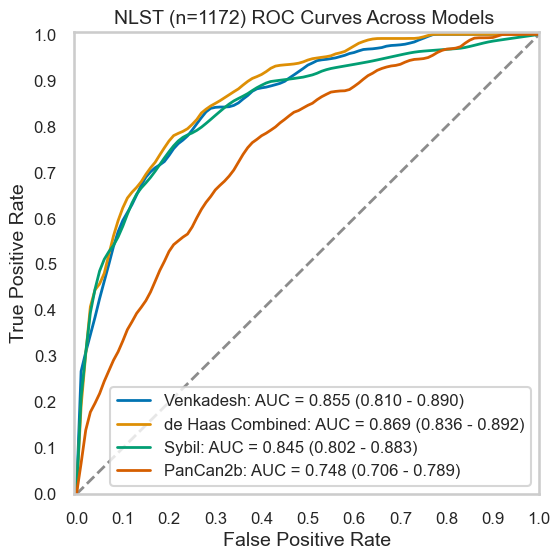

,Venkadesh,de Haas Combined,Sybil,PanCan2b
score,0.854953,0.868596,0.844700,0.748077
ci-hi,0.889986,0.892201,0.883341,0.788680
ci-lo,0.810416,0.836277,0.802168,0.706429


In [6]:
utils.rocs_models(nlst_preds, models=MODEL_TO_COL, dataset_label="NLST")

## Plot results by category

In [23]:
def plot_by_category(df, cat):
    display(Markdown(f"#### {cat}"))
    catinfo, aucs, z, p = utils.roc_by_category(df, cat, MODEL_TO_COL, min_mal=2)
    display(catinfo)
    
    # if sigtestresults is not None:
    #     print("Hanley-McNeil significance test results:")
    #     display(sigtestresults)
    # else:
    #     print("Not binary: not computing significance test results.")

    if len(catinfo) > 2 and p is not None:
        for m in p: 
            print(m)
            # display(aucs[m])
            # display(z[m])
            display(p[m])

### Included columns (from predictions)

#### FamilyHistoryLungCa

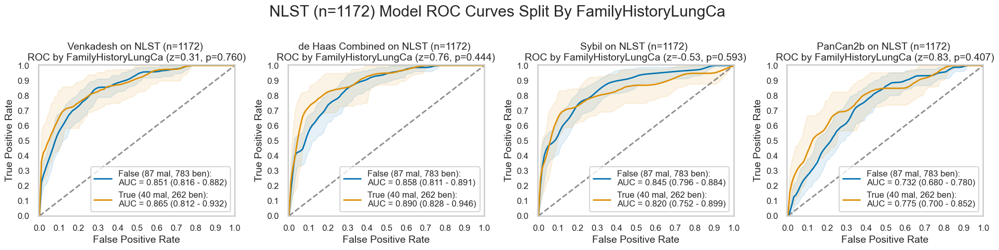

,num,pct,num_mal,pct_mal
False,870,74.232082,87,10.000000
True,302,25.767918,40,13.245033


#### PersonalCancerHist

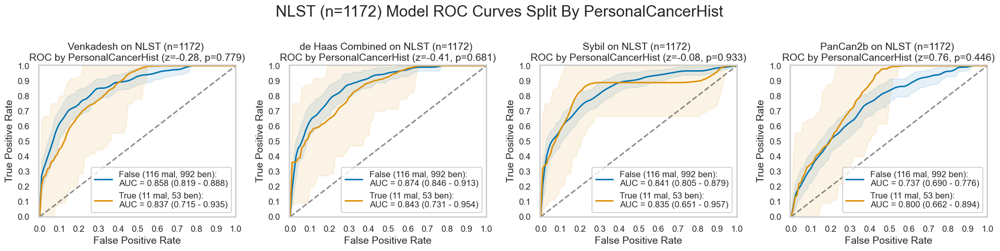

,num,pct,num_mal,pct_mal
False,1108,94.539249,116,10.469314
True,64,5.460751,11,17.187500


#### wrknomask

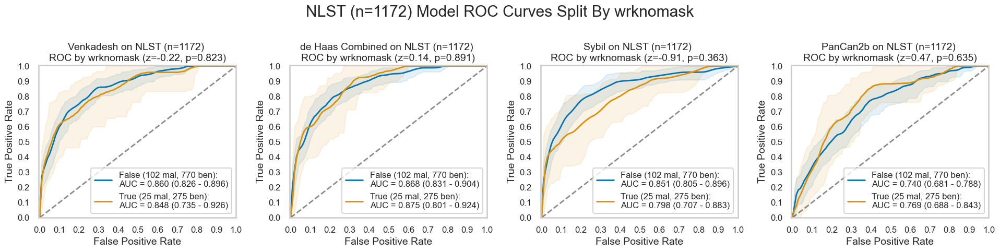

,num,pct,num_mal,pct_mal
False,872,74.40273,102,11.697248
True,300,25.59727,25,8.333333


#### Emphysema

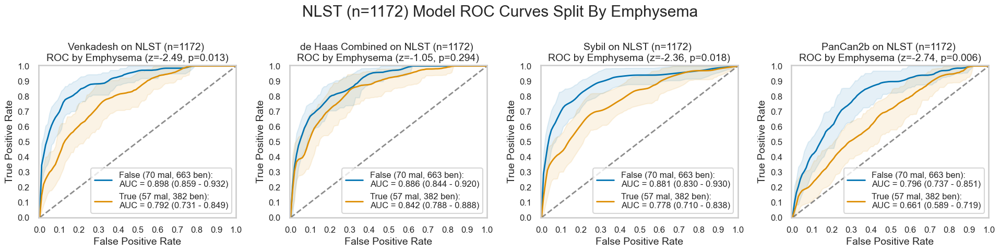

,num,pct,num_mal,pct_mal
False,733,62.542662,70,9.549795
True,439,37.457338,57,12.984055


In [24]:
for c in nlst_democols['cat']['other']:
    plot_by_category(nlst_preds, c)

### Nodule information

#### GroundGlassOpacity

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,841,71.757679,127,15.10107
True,331,28.242321,0,0.00000


#### NoduleInUpperLung

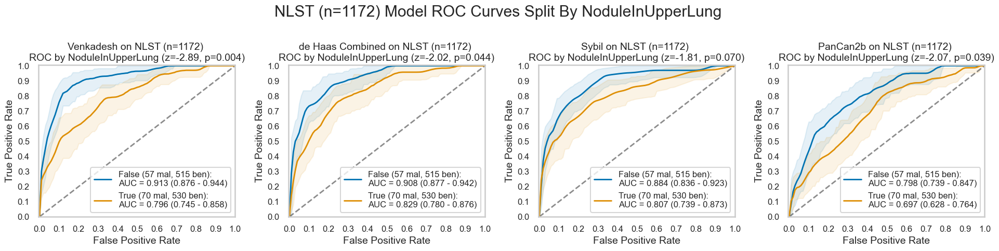

,num,pct,num_mal,pct_mal
False,572,48.805461,57,9.965035
True,600,51.194539,70,11.666667


#### Perifissural

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,1090,93.003413,127,11.651376
True,82,6.996587,0,0.000000


#### NonSolid

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,1165,99.40273,120,10.300429
True,7,0.59727,7,100.000000


#### Calcified

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,1172,100.0,127,10.836177


#### Spiculation

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,1168,99.658703,123,10.530822
True,4,0.341297,4,100.000000


#### PartSolid

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,1148,97.952218,103,8.972125
True,24,2.047782,24,100.000000


#### Solid

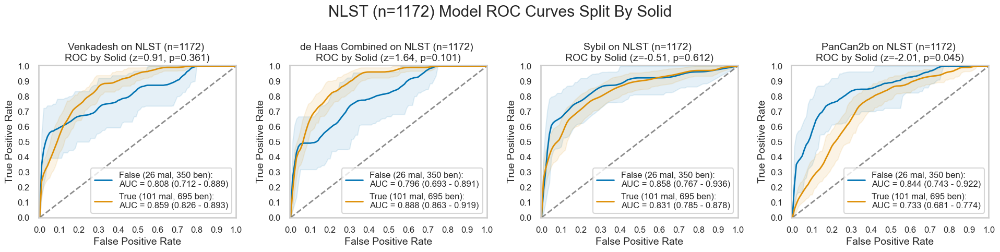

,num,pct,num_mal,pct_mal
False,376,32.081911,26,6.914894
True,796,67.918089,101,12.688442


#### SemiSolid

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,1029,87.798635,127,12.34208
True,143,12.201365,0,0.00000


In [25]:
for c in nlst_democols['cat']['nodule']:
    plot_by_category(nlst_preds, c)

### Demographics

#### Overweight

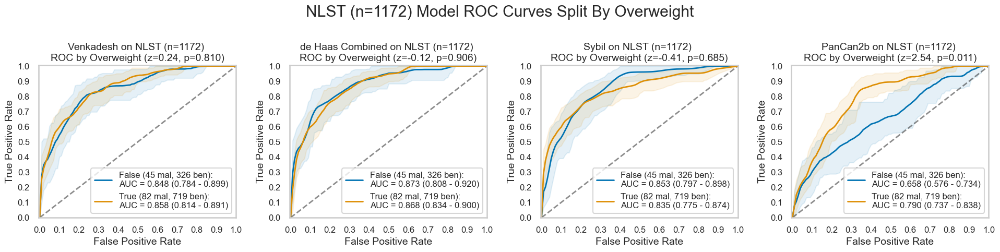

,num,pct,num_mal,pct_mal
False,371,31.65529,45,12.129380
True,801,68.34471,82,10.237203


#### educat

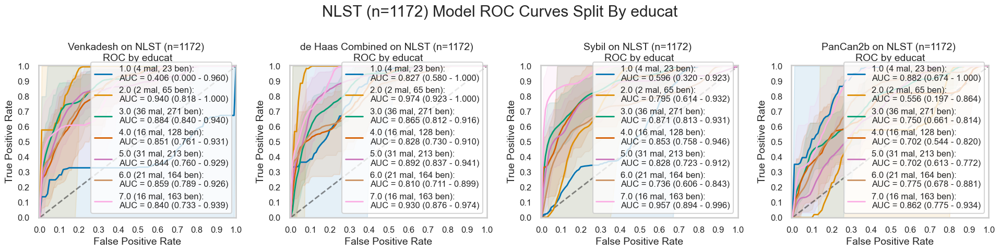

,num,pct,num_mal,pct_mal
1.0,27,2.341717,4,14.814815
2.0,67,5.810928,2,2.985075
3.0,307,26.626193,36,11.726384
4.0,144,12.489159,16,11.111111
5.0,244,21.162186,31,12.704918
6.0,185,16.045100,21,11.351351
7.0,179,15.524718,16,8.938547


Venkadesh


,1.0,2.0,3.0,4.0,5.0,6.0,7.0
1.0,1.000000,0.002146,0.000317,0.001613,0.001172,0.001001,0.002218
2.0,0.002146,1.000000,0.651949,0.500676,0.445512,0.528148,0.451358
3.0,0.000317,0.651949,1.000000,0.632174,0.475487,0.684011,0.531843
4.0,0.001613,0.500676,0.632174,1.000000,0.926052,0.919305,0.896689
5.0,0.001172,0.445512,0.475487,0.926052,1.000000,0.824977,0.954662
6.0,0.001001,0.528148,0.684011,0.919305,0.824977,1.000000,0.811115
7.0,0.002218,0.451358,0.531843,0.896689,0.954662,0.811115,1.000000


de Haas Combined


,1.0,2.0,3.0,4.0,5.0,6.0,7.0
1.0,1.000000,0.329259,0.775264,0.994271,0.625276,0.902412,0.446999
2.0,0.329259,1.000000,0.218047,0.149772,0.353398,0.092518,0.628288
3.0,0.775264,0.218047,1.000000,0.613057,0.615203,0.416595,0.267570
4.0,0.994271,0.149772,0.613057,1.000000,0.380611,0.829192,0.183668
5.0,0.625276,0.353398,0.615203,0.380611,1.000000,0.224803,0.516219
6.0,0.902412,0.092518,0.416595,0.829192,0.224803,1.000000,0.093371
7.0,0.446999,0.628288,0.267570,0.183668,0.516219,0.093371,1.000000


Sybil


,1.0,2.0,3.0,4.0,5.0,6.0,7.0
1.0,1.000000,0.409486,0.071235,0.106063,0.132520,0.381194,0.017549
2.0,0.409486,1.000000,0.697249,0.771739,0.866724,0.767600,0.405665
3.0,0.071235,0.697249,1.000000,0.800678,0.463048,0.059313,0.096734
4.0,0.106063,0.771739,0.800678,1.000000,0.735163,0.167698,0.133916
5.0,0.132520,0.866724,0.463048,0.735163,1.000000,0.222377,0.024091
6.0,0.381194,0.767600,0.059313,0.167698,0.222377,1.000000,0.001738
7.0,0.017549,0.405665,0.096734,0.133916,0.024091,0.001738,1.000000


PanCan2b


,1.0,2.0,3.0,4.0,5.0,6.0,7.0
1.0,1.000000,0.173119,0.277609,0.174788,0.143989,0.396977,0.879467
2.0,0.173119,1.000000,0.368277,0.513350,0.500543,0.318837,0.161975
3.0,0.277609,0.368277,1.000000,0.565451,0.481671,0.746500,0.130334
4.0,0.174788,0.513350,0.565451,1.000000,0.994400,0.430813,0.080715
5.0,0.143989,0.500543,0.481671,0.994400,1.000000,0.352587,0.037955
6.0,0.396977,0.318837,0.746500,0.430813,0.352587,1.000000,0.288267
7.0,0.879467,0.161975,0.130334,0.080715,0.037955,0.288267,1.000000


#### Gender

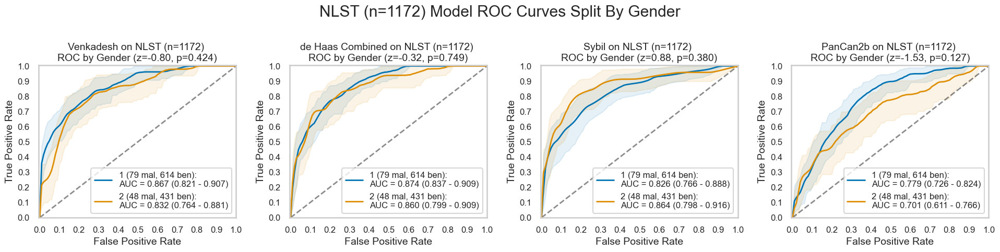

,num,pct,num_mal,pct_mal
1,693,59.129693,79,11.399711
2,479,40.870307,48,10.020877


#### Married

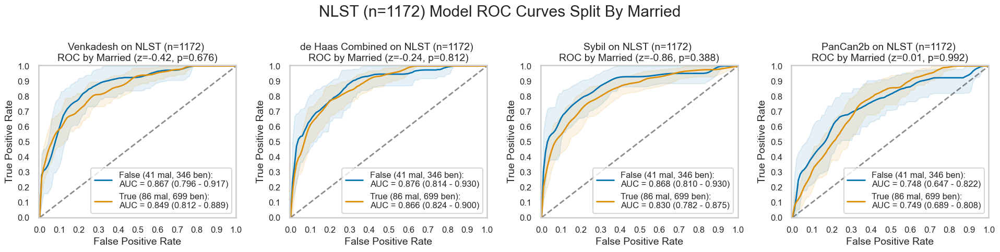

,num,pct,num_mal,pct_mal
False,387,33.020478,41,10.594315
True,785,66.979522,86,10.955414


#### HighSchoolPlus

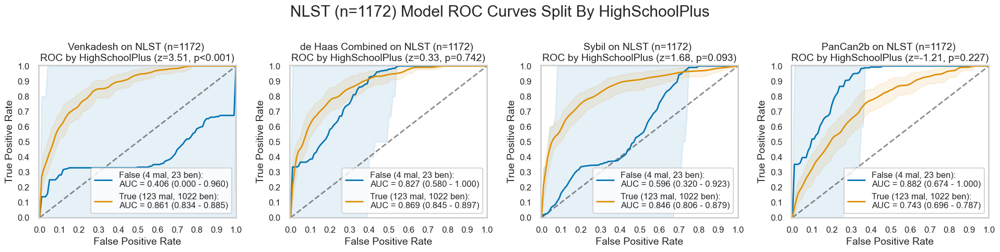

,num,pct,num_mal,pct_mal
False,27,2.303754,4,14.814815
True,1145,97.696246,123,10.742358


#### NonHispanicWhite

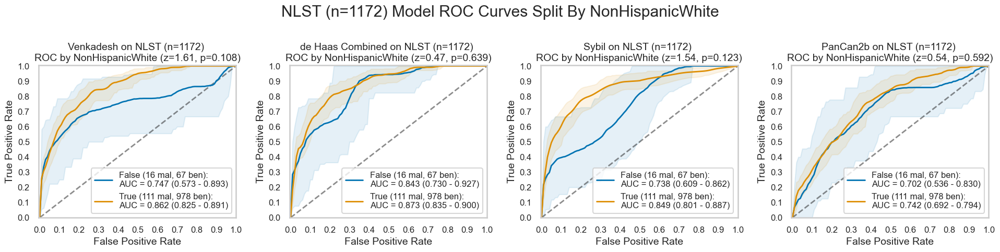

,num,pct,num_mal,pct_mal
False,83,7.081911,16,19.277108
True,1089,92.918089,111,10.192837


#### Unfinished_ed

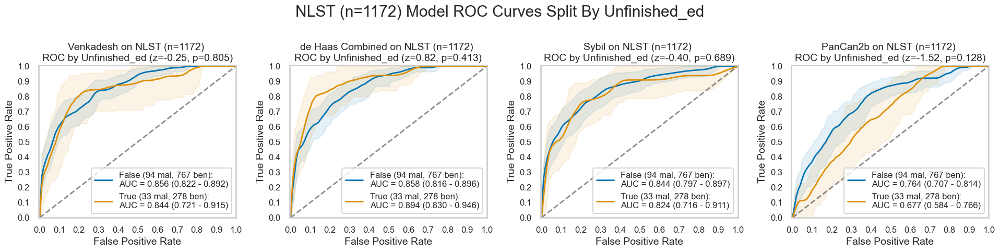

,num,pct,num_mal,pct_mal
False,861,73.464164,94,10.917538
True,311,26.535836,33,10.610932


#### WhiteOrBlack

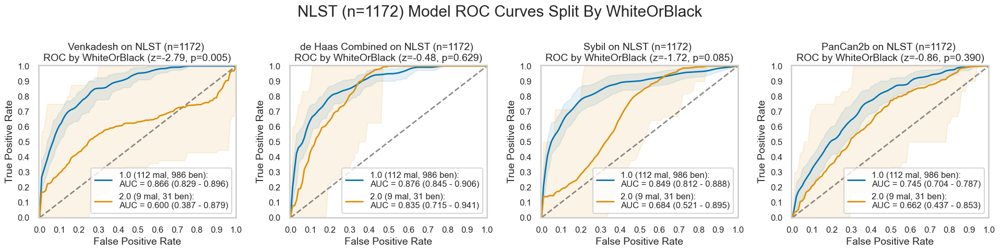

,num,pct,num_mal,pct_mal
1.0,1098,96.485062,112,10.200364
2.0,40,3.514938,9,22.500000


#### marital

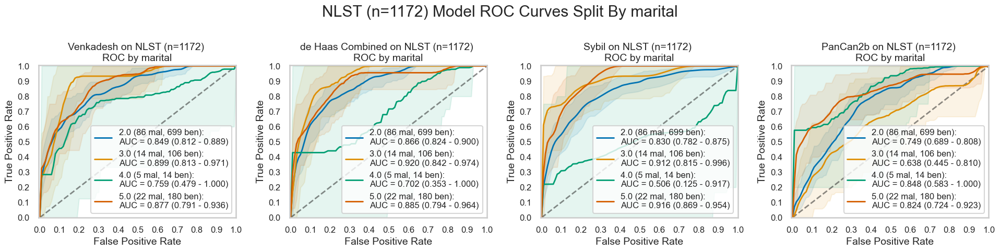

,num,pct,num_mal,pct_mal
1.0,46,3.924915,0,0.000000
2.0,785,66.979522,86,10.955414
3.0,120,10.238908,14,11.666667
4.0,19,1.621160,5,26.315789
5.0,202,17.235495,22,10.891089


Venkadesh


,2.0,3.0,4.0,5.0
2.0,1.000000,0.410195,0.476046,0.604765
3.0,0.410195,1.000000,0.300646,0.760551
4.0,0.476046,0.300646,1.000000,0.373111
5.0,0.604765,0.760551,0.373111,1.000000


de Haas Combined


,2.0,3.0,4.0,5.0
2.0,1.000000,0.340100,0.207211,0.719369
3.0,0.340100,1.000000,0.113119,0.612855
4.0,0.207211,0.113119,1.000000,0.178130
5.0,0.719369,0.612855,0.178130,1.000000


Sybil


,2.0,3.0,4.0,5.0
2.0,1.000000,0.158657,0.008502,0.077292
3.0,0.158657,1.000000,0.001911,0.956353
4.0,0.008502,0.001911,1.000000,0.001232
5.0,0.077292,0.956353,0.001232,1.000000


PanCan2b


,2.0,3.0,4.0,5.0
2.0,1.000000,0.180425,0.380006,0.223218
3.0,0.180425,1.000000,0.115700,0.048512
4.0,0.380006,0.115700,1.000000,0.841443
5.0,0.223218,0.048512,0.841443,1.000000


#### ethnic

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
1.0,11,0.940171,1,9.090909
2.0,1159,99.059829,126,10.871441


#### race

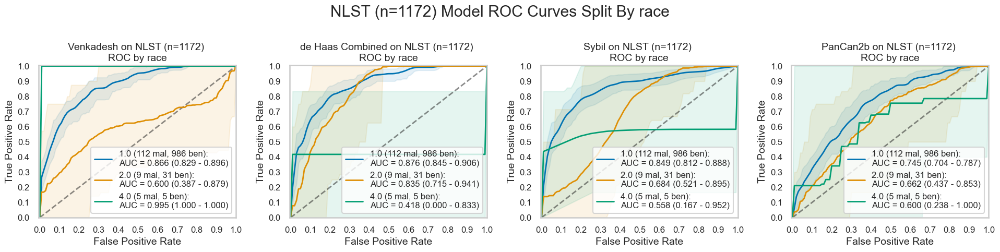

,num,pct,num_mal,pct_mal
1.0,1098,93.926433,112,10.200364
2.0,40,3.421728,9,22.500000
3.0,7,0.598802,0,0.000000
4.0,10,0.855432,5,50.000000
5.0,3,0.256630,1,33.333333
6.0,11,0.940975,0,0.000000


Venkadesh


,1.0,2.0,4.0
1.0,1.000000,0.005190,0.000075
2.0,0.005190,1.000000,0.000038
4.0,0.000075,0.000038,1.000000


de Haas Combined


,1.0,2.0,4.0
1.0,1.000000e+00,0.628688,8.781286e-08
2.0,6.286883e-01,1.000000,3.391368e-04
4.0,8.781286e-08,0.000339,1.000000e+00


Sybil


,1.0,2.0,4.0
1.0,1.000000,0.084723,0.008980
2.0,0.084723,1.000000,0.382466
4.0,0.008980,0.382466,1.000000


PanCan2b


,1.0,2.0,4.0
1.0,1.000000,0.389543,0.214518
2.0,0.389543,1.000000,0.675976
4.0,0.214518,0.675976,1.000000


In [26]:
for cat in nlst_democols['cat']['demo']:
    plot_by_category(nlst_preds, cat)

### Smoking

#### smokelive

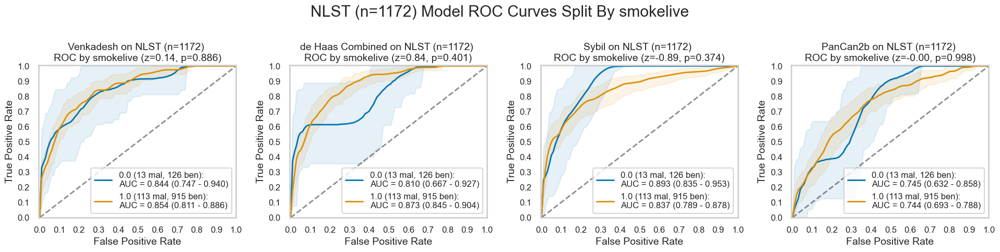

,num,pct,num_mal,pct_mal
0.0,139,11.910883,13,9.352518
1.0,1028,88.089117,113,10.992218


#### cigar

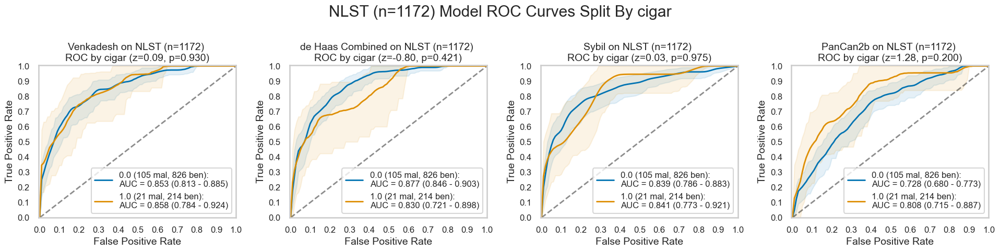

,num,pct,num_mal,pct_mal
0.0,931,79.845626,105,11.278195
1.0,235,20.154374,21,8.936170


#### cigsmok

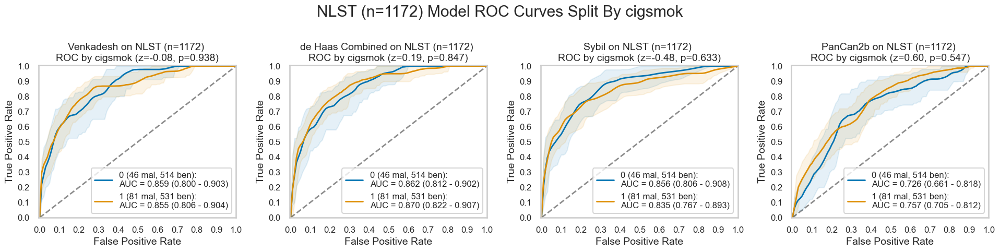

,num,pct,num_mal,pct_mal
0,560,47.78157,46,8.214286
1,612,52.21843,81,13.235294


#### smokework

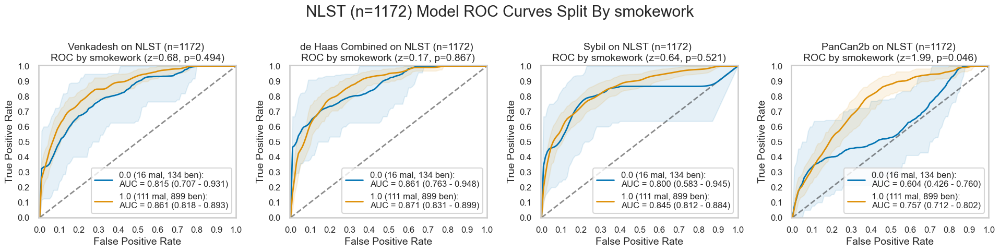

,num,pct,num_mal,pct_mal
0.0,150,12.931034,16,10.666667
1.0,1010,87.068966,111,10.990099


#### pipe

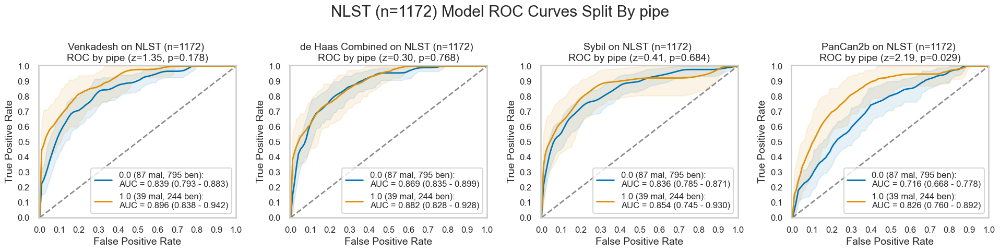

,num,pct,num_mal,pct_mal
0.0,882,75.708155,87,9.863946
1.0,283,24.291845,39,13.780919


In [27]:
for cat in nlst_democols['cat']['smoke']:
    plot_by_category(nlst_preds, cat)

### Work history

#### wrkbaki

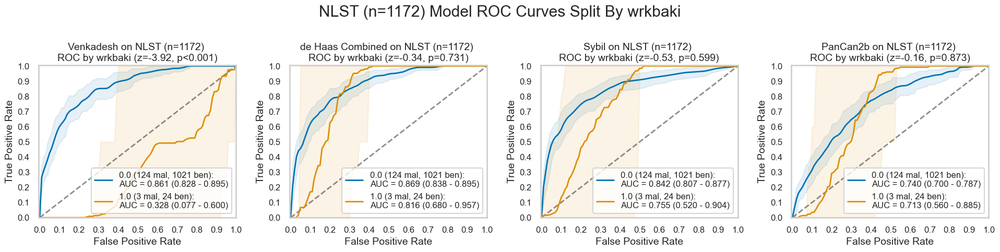

,num,pct,num_mal,pct_mal
0.0,1145,97.696246,124,10.829694
1.0,27,2.303754,3,11.111111


#### wrkfoun

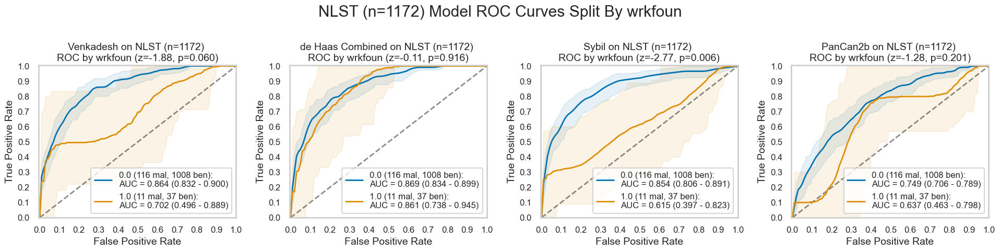

,num,pct,num_mal,pct_mal
0.0,1124,95.904437,116,10.320285
1.0,48,4.095563,11,22.916667


#### wrkchem

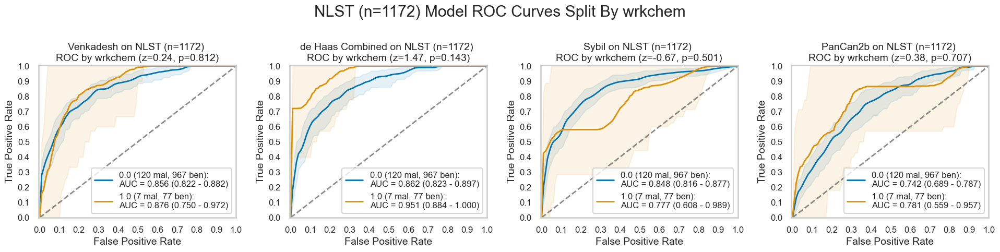

,num,pct,num_mal,pct_mal
0.0,1087,92.826644,120,11.039558
1.0,84,7.173356,7,8.333333


#### wrkasbe

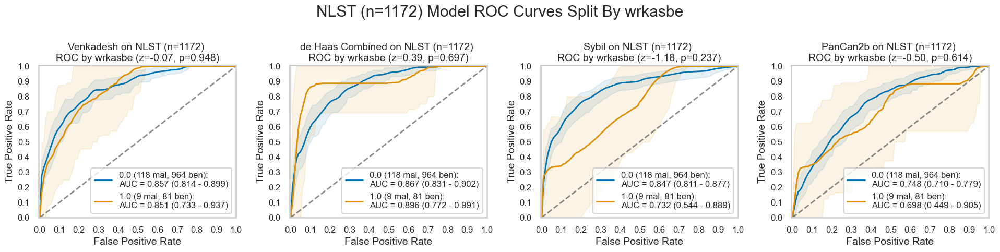

,num,pct,num_mal,pct_mal
0.0,1082,92.320819,118,10.90573
1.0,90,7.679181,9,10.00000


#### wrkfire

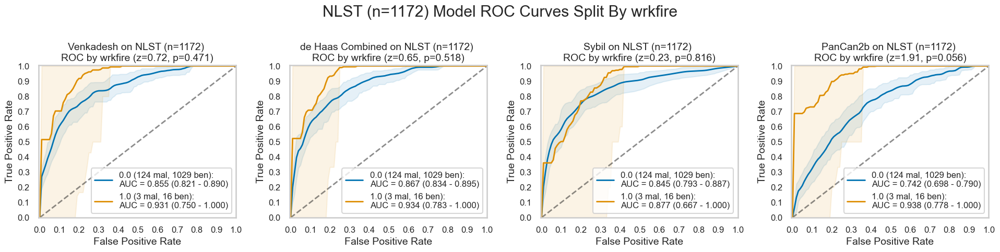

,num,pct,num_mal,pct_mal
0.0,1153,98.37884,124,10.754553
1.0,19,1.62116,3,15.789474


#### wrksand

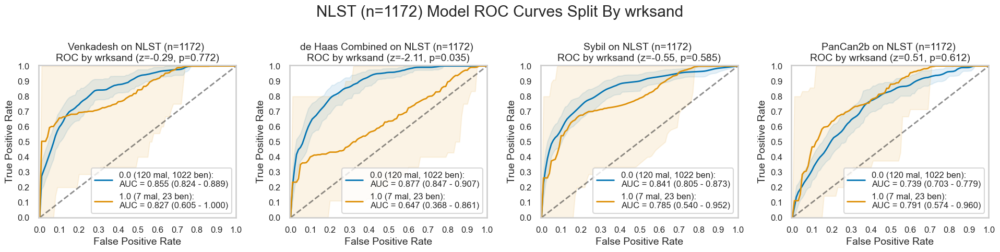

,num,pct,num_mal,pct_mal
0.0,1142,97.440273,120,10.507881
1.0,30,2.559727,7,23.333333


#### wrkfarm

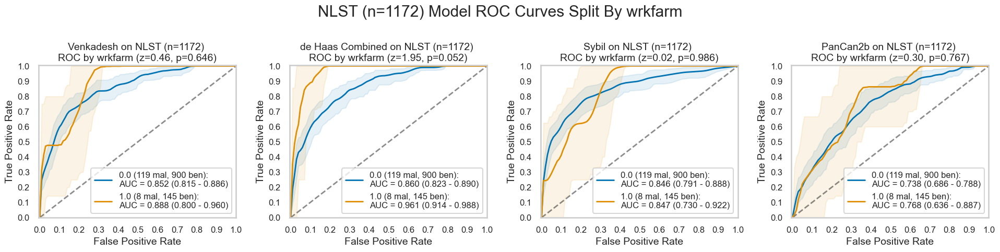

,num,pct,num_mal,pct_mal
0.0,1019,86.945392,119,11.678116
1.0,153,13.054608,8,5.228758


#### wrkcoal

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,1169,99.744027,126,10.778443
1.0,3,0.255973,1,33.333333


#### wrkpain

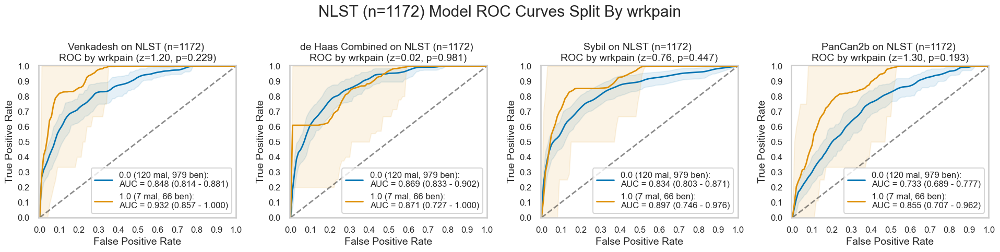

,num,pct,num_mal,pct_mal
0.0,1099,93.771331,120,10.919017
1.0,73,6.228669,7,9.589041


#### wrkweld

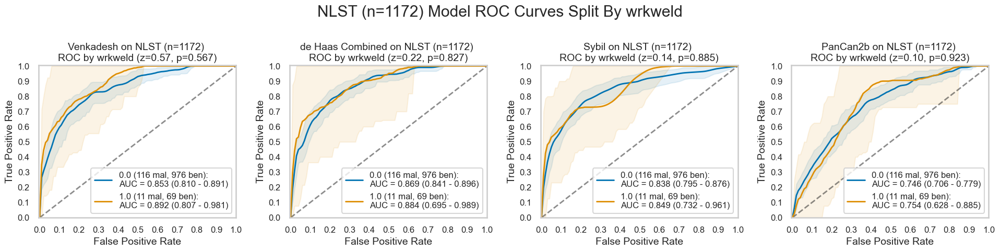

,num,pct,num_mal,pct_mal
0.0,1092,93.174061,116,10.622711
1.0,80,6.825939,11,13.750000


#### wrkflou

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,1153,98.37884,127,11.014744
1.0,19,1.62116,0,0.000000


#### wrkbutc

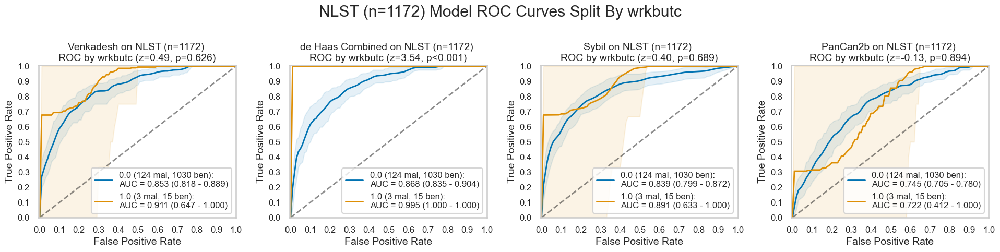

,num,pct,num_mal,pct_mal
0.0,1154,98.464164,124,10.745234
1.0,18,1.535836,3,16.666667


#### wrkhard

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,1162,99.146758,127,10.929432
1.0,10,0.853242,0,0.000000


#### wrkcott

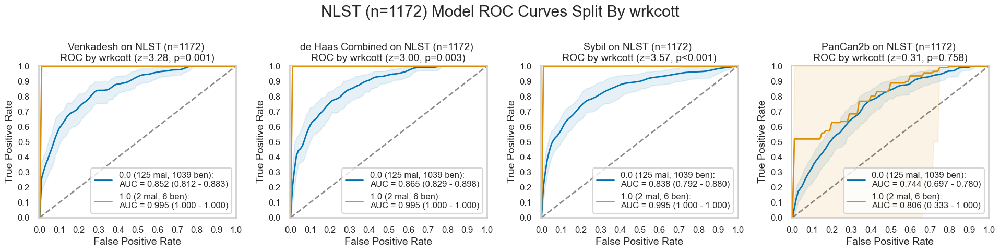

,num,pct,num_mal,pct_mal
0.0,1164,99.317406,125,10.738832
1.0,8,0.682594,2,25.000000


In [28]:
for cat in nlst_democols['cat']['work']:
    plot_by_category(nlst_preds, cat)

### Disease history

#### Emphysema

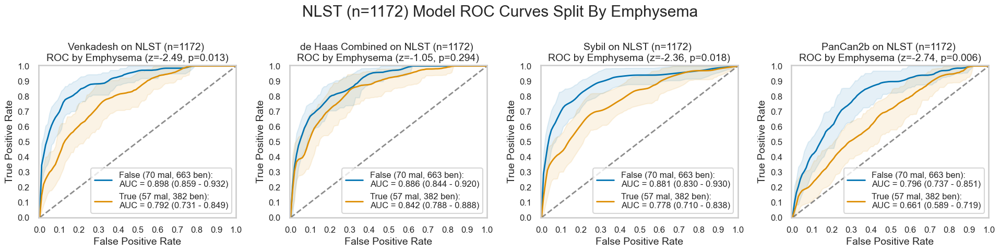

,num,pct,num_mal,pct_mal
False,733,62.542662,70,9.549795
True,439,37.457338,57,12.984055


In [29]:
plot_by_category(nlst_preds, 'Emphysema')

#### diagasbe

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,1147,98.034188,127,11.072363
1.0,23,1.965812,0,0.000000


#### diagchas

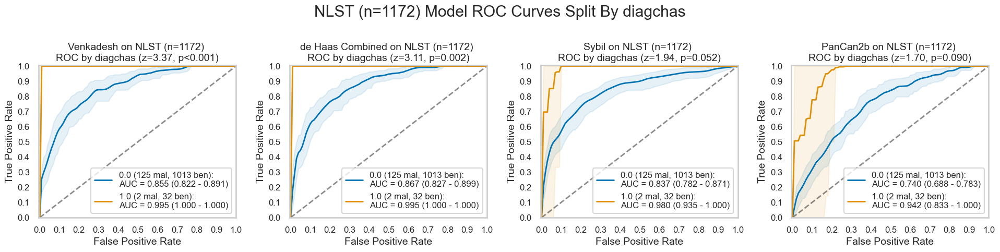

,num,pct,num_mal,pct_mal
0.0,1138,97.098976,125,10.984183
1.0,34,2.901024,2,5.882353


#### diagpneu

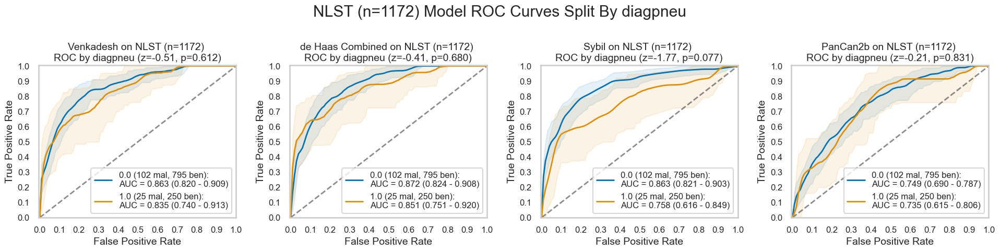

,num,pct,num_mal,pct_mal
0.0,897,76.535836,102,11.371237
1.0,275,23.464164,25,9.090909


#### diagstro

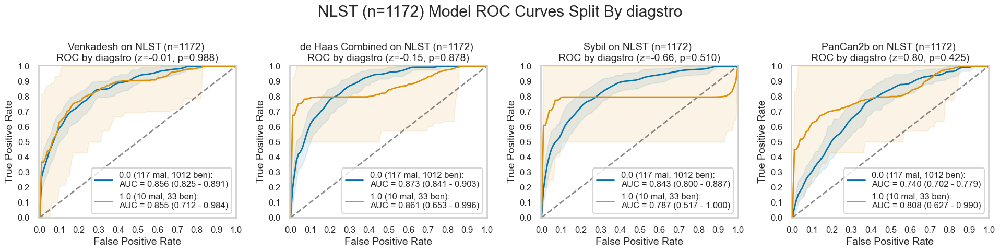

,num,pct,num_mal,pct_mal
0.0,1129,96.331058,117,10.363153
1.0,43,3.668942,10,23.255814


#### diagemph

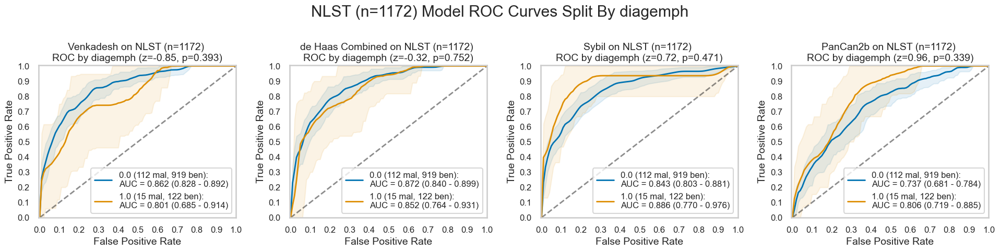

,num,pct,num_mal,pct_mal
0.0,1031,88.270548,112,10.863240
1.0,137,11.729452,15,10.948905


#### diagbron

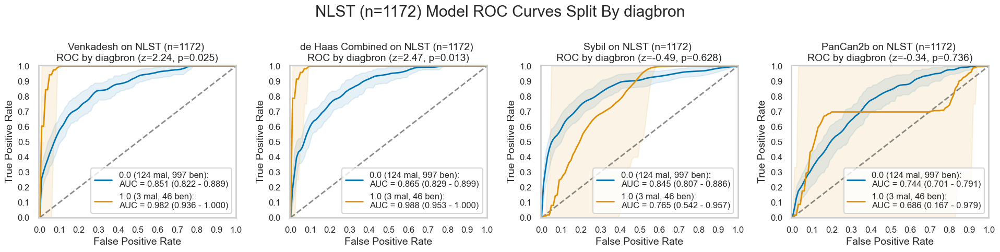

,num,pct,num_mal,pct_mal
0.0,1121,95.811966,124,11.061552
1.0,49,4.188034,3,6.122449


#### diagsili

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,1170,99.829352,127,10.854701
1.0,2,0.170648,0,0.000000


#### diagsarc

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,1170,99.829352,126,10.769231
1.0,2,0.170648,1,50.000000


#### diaghear

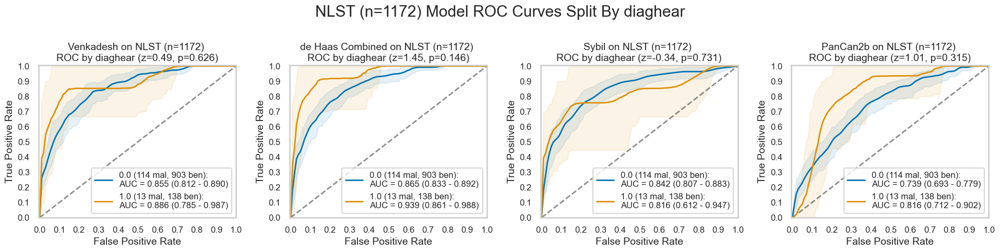

,num,pct,num_mal,pct_mal
0.0,1017,87.071918,114,11.209440
1.0,151,12.928082,13,8.609272


#### diagdiab

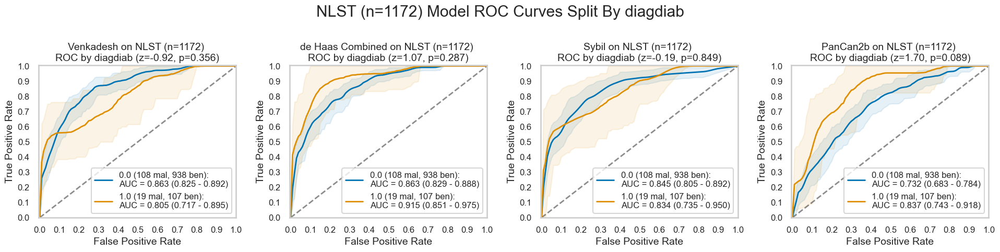

,num,pct,num_mal,pct_mal
0.0,1046,89.249147,108,10.325048
1.0,126,10.750853,19,15.079365


#### diagadas

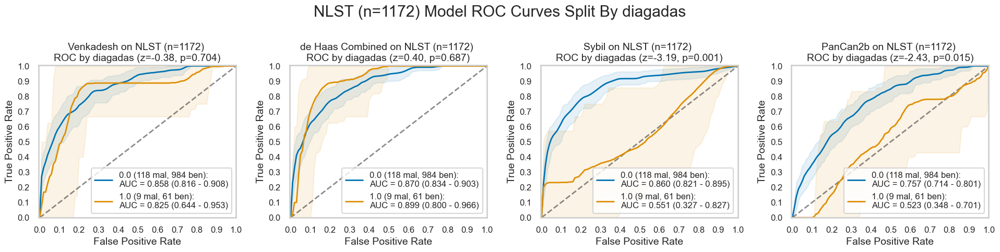

,num,pct,num_mal,pct_mal
0.0,1102,94.027304,118,10.707804
1.0,70,5.972696,9,12.857143


#### diagcopd

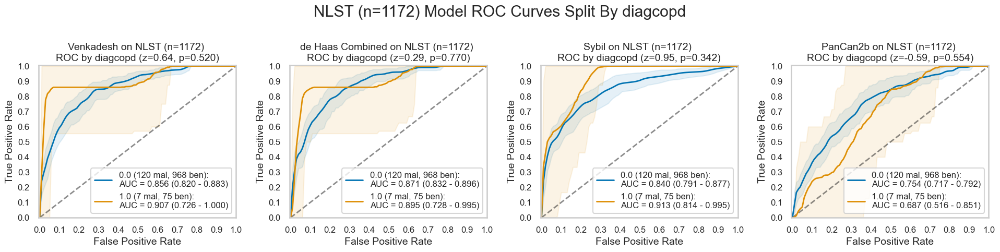

,num,pct,num_mal,pct_mal
0.0,1088,92.991453,120,11.029412
1.0,82,7.008547,7,8.536585


#### diagfibr

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,1166,99.488055,127,10.891938
1.0,6,0.511945,0,0.000000


#### diagtube

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,1148,97.952218,127,11.062718
1.0,24,2.047782,0,0.000000


#### diaghype

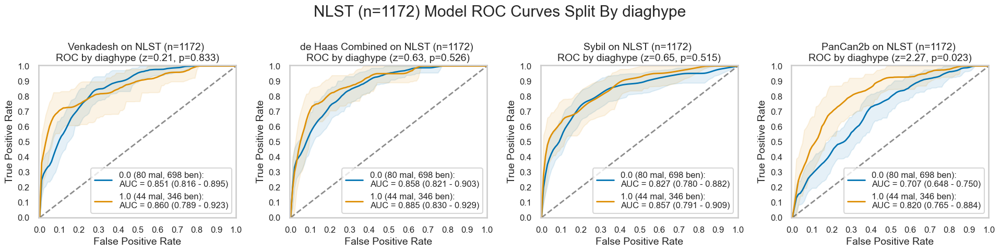

,num,pct,num_mal,pct_mal
0.0,778,66.609589,80,10.282776
1.0,390,33.390411,44,11.282051


#### diagchro

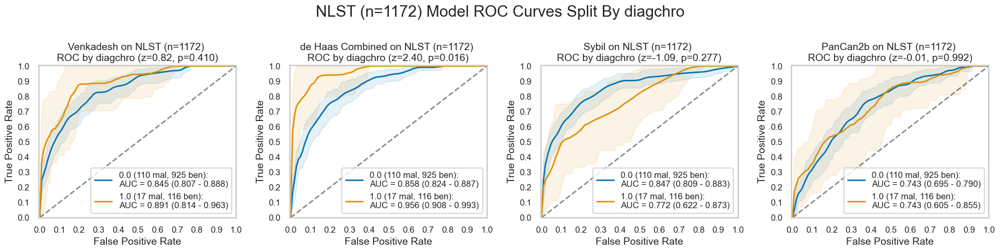

,num,pct,num_mal,pct_mal
0.0,1035,88.613014,110,10.628019
1.0,133,11.386986,17,12.781955


In [30]:
for cat in nlst_democols['cat']['disease']:
    plot_by_category(nlst_preds, cat)

## Binning for numerical columns

### Demographic columns

#### BMI

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1044.0,27.651995,4.893146,16.242386,24.271788,27.258353,30.685928,51.010481
1,127.0,26.658295,4.558551,18.302959,23.745543,25.824490,29.130280,47.587692


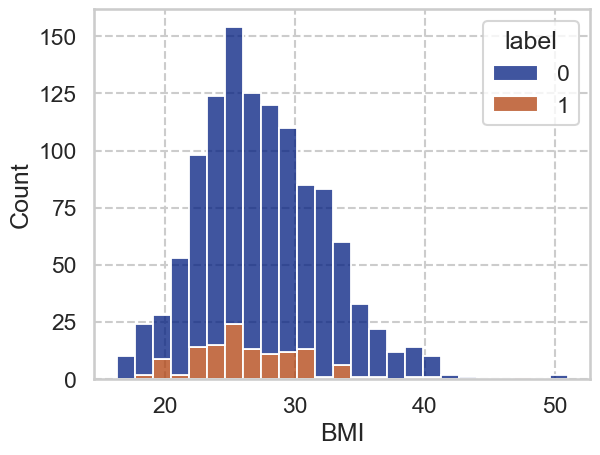

#### Age

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,63.199043,5.379523,55.0,59.0,62.0,67.0,76.0
1,127.0,64.062992,5.226228,55.0,60.5,63.0,68.0,75.0


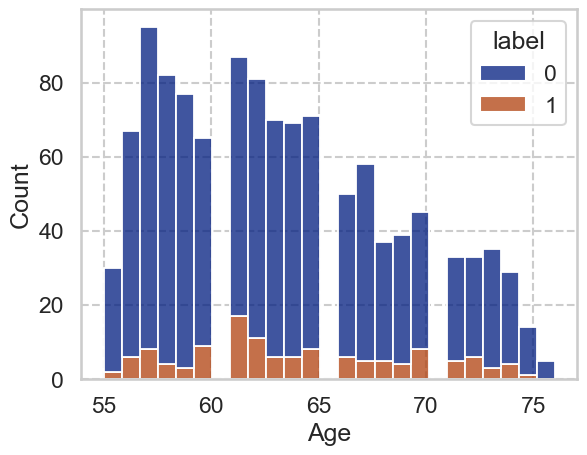

#### height

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,68.096651,3.856283,59.0,65.0,68.0,71.0,78.0
1,127.0,68.417323,3.736225,60.0,66.0,69.0,71.0,76.0


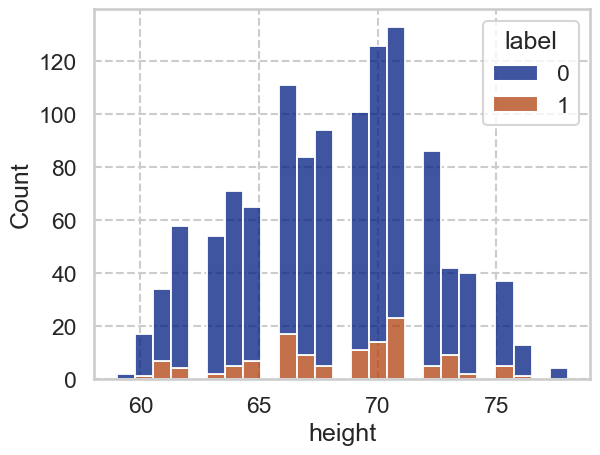

#### weight

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1044.0,183.356322,39.848243,90.0,157.0,180.0,206.0,315.0
1,127.0,178.244094,36.405720,108.0,157.0,180.0,200.0,322.0


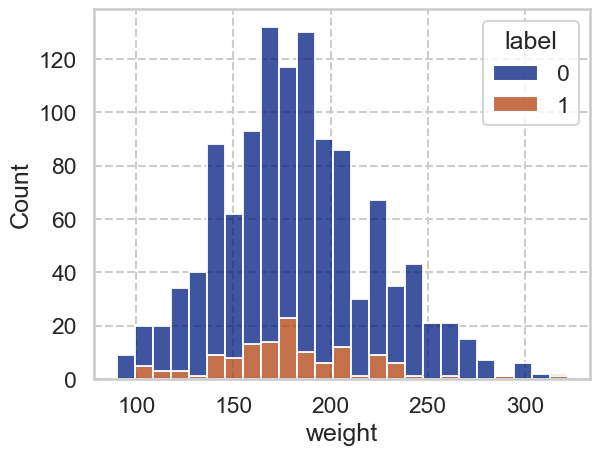

In [31]:
for c in nlst_democols['num']['demo']:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_21684\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                 BMI  \
                  count      mean       std  min  25%  50%  75%  max  count   
bin_BMI                                                                       
(16.241, 27.044]  586.0  0.127986  0.334360  0.0  0.0  0.0  0.0  1.0  586.0   
(27.044, 51.01]   585.0  0.088889  0.284827  0.0  0.0  0.0  0.0  1.0  585.0   

                                                                        \
                       mean       std        min        25%        50%   
bin_BMI                                                                  
(16.241, 27.044]  23.719689  2.357405  16.242386  22.440233  24.221202   
(27.044, 51.01]   31.375296  3.534062  27.092671  28.734213  30.565217   

                                        
                        75%        max  
bin_BMI                                 
(16.241, 27.044]  25.716379  27.043535  
(27.044, 51.01]   33.190637  51.010481

#### bin_BMI

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:318: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


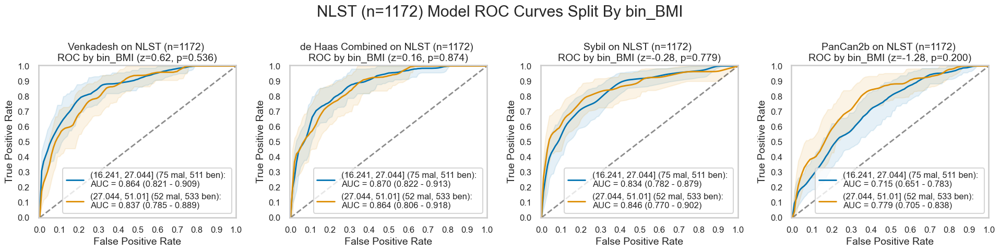

,num,pct,num_mal,pct_mal
"(16.241, 27.044]",586,50.042699,75,12.798635
"(27.044, 51.01]",585,49.957301,52,8.888889


C:\Users\shaur\AppData\Local\Temp\ipykernel_21684\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                 Age  \
                count      mean       std  min  25%  50%  75%  max  count   
bin_Age                                                                     
(54.999, 63.0]  654.0  0.100917  0.301450  0.0  0.0  0.0  0.0  1.0  654.0   
(63.0, 76.0]    518.0  0.117761  0.322636  0.0  0.0  0.0  0.0  1.0  518.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_Age                                                           
(54.999, 63.0]  59.25841  2.400654  55.0  57.0  59.0  61.0  63.0  
(63.0, 76.0]    68.38610  3.376096  64.0  65.0  68.0  71.0  76.0

#### bin_Age

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:318: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


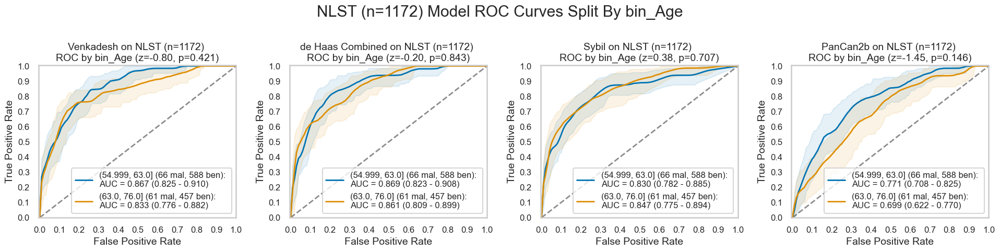

,num,pct,num_mal,pct_mal
"(54.999, 63.0]",654,55.802048,66,10.091743
"(63.0, 76.0]",518,44.197952,61,11.776062


C:\Users\shaur\AppData\Local\Temp\ipykernel_21684\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              height  \
                count      mean       std  min  25%  50%  75%  max  count   
bin_height                                                                  
(58.999, 68.0]  590.0  0.096610  0.295677  0.0  0.0  0.0  0.0  1.0  590.0   
(68.0, 78.0]    582.0  0.120275  0.325563  0.0  0.0  0.0  0.0  1.0  582.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_height                                                         
(58.999, 68.0]  64.957627  2.309624  59.0  63.0  65.0  67.0  68.0  
(68.0, 78.0]    71.348797  1.939797  69.0  70.0  71.0  72.0  78.0

#### bin_height

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:318: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


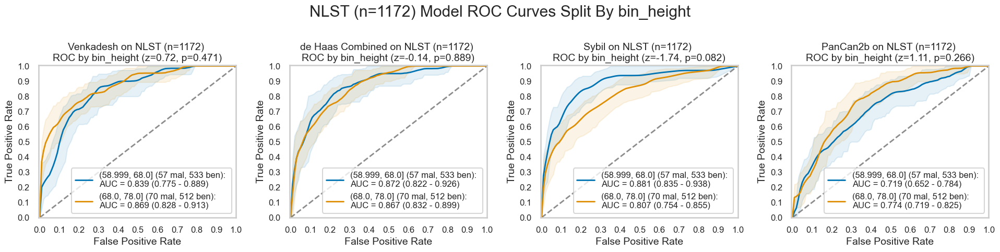

,num,pct,num_mal,pct_mal
"(58.999, 68.0]",590,50.341297,57,9.661017
"(68.0, 78.0]",582,49.658703,70,12.027491


C:\Users\shaur\AppData\Local\Temp\ipykernel_21684\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              weight  \
                 count      mean       std  min  25%  50%  75%  max  count   
bin_weight                                                                   
(89.999, 180.0]  605.0  0.120661  0.326003  0.0  0.0  0.0  0.0  1.0  605.0   
(180.0, 322.0]   566.0  0.095406  0.294035  0.0  0.0  0.0  0.0  1.0  566.0   

                                                                           
                       mean        std    min    25%    50%    75%    max  
bin_weight                                                                 
(89.999, 180.0]  152.778512  21.066998   90.0  140.0  158.0  170.0  180.0  
(180.0, 322.0]   214.893993  27.580217  181.0  193.0  206.0  230.0  322.0

#### bin_weight

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:318: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


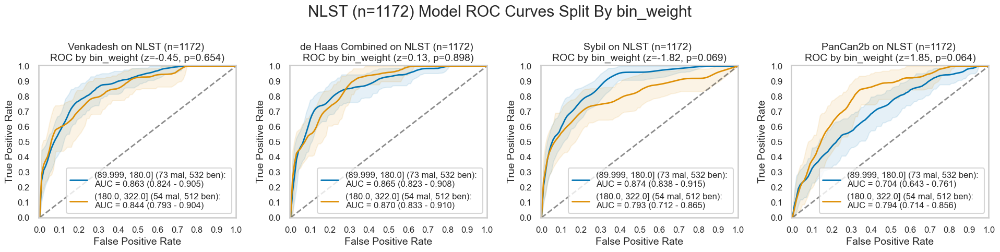

,num,pct,num_mal,pct_mal
"(89.999, 180.0]",605,51.665243,73,12.066116
"(180.0, 322.0]",566,48.334757,54,9.540636


In [32]:
for c in nlst_democols['num']['demo']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

In [33]:
# nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
# display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
# plot_by_category(nlst_preds, f'bin_height')

In [34]:
# nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
# display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
# plot_by_category(nlst_preds, f'bin_weight')

### Smoking columns

#### smokeage

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,16.448804,3.476042,5.0,14.0,16.0,18.0,40.0
1,127.0,16.220472,3.231574,8.0,14.0,16.0,18.0,26.0


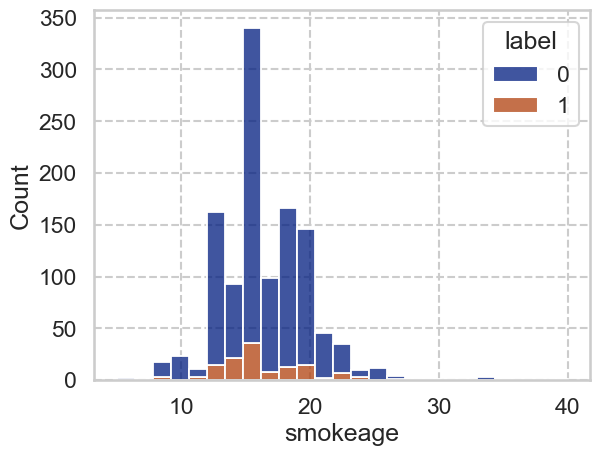

#### smokeday

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,28.328230,11.434740,12.0,20.0,25.0,32.0,80.0
1,127.0,31.818898,12.065573,18.0,20.0,30.0,40.0,80.0


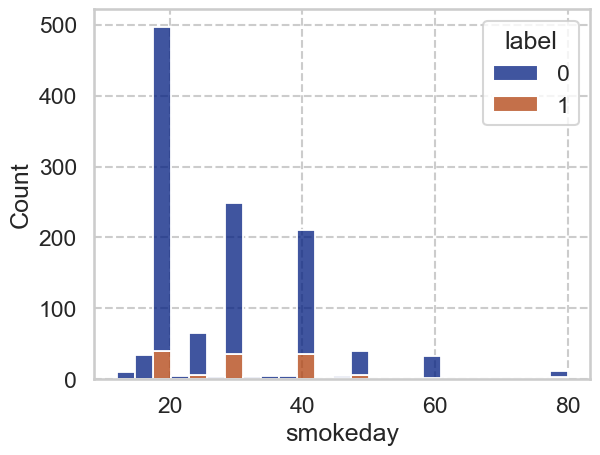

#### smokeyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,40.886124,7.696808,17.0,36.0,41.0,46.0,61.0
1,127.0,44.086614,7.219928,29.0,39.0,44.0,49.0,65.0


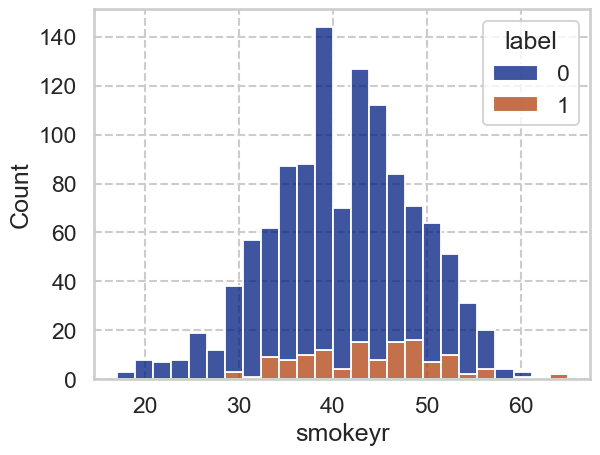

#### pkyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,56.656603,22.031699,30.0,40.00,50.0,67.50,162.0
1,127.0,70.186220,29.608258,30.0,49.75,64.5,84.75,224.0


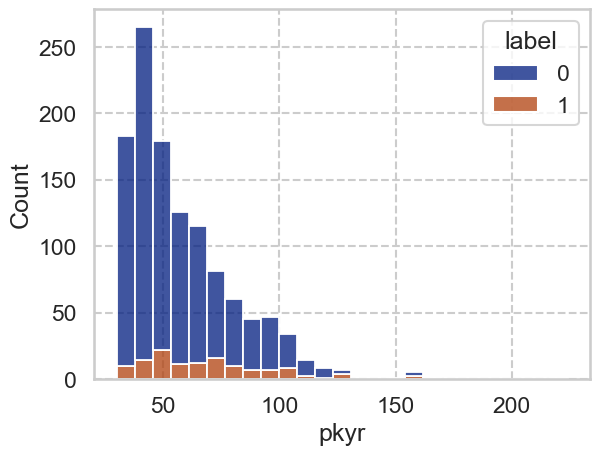

In [35]:
for c in nlst_democols['num']['smoke']:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_21684\3728513433.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeage  \
               count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                 
(4.999, 16.0]  648.0  0.120370  0.325646  0.0  0.0  0.0  0.0  1.0    648.0   
(16.0, 40.0]   524.0  0.093511  0.291426  0.0  0.0  0.0  0.0  1.0    524.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_smokeage                                                      
(4.999, 16.0]  14.074074  1.907621   5.0  13.0  15.0  16.0  16.0  
(16.0, 40.0]   19.330153  2.615545  17.0  18.0  18.0  20.0  40.0

#### bin_smokeage

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:318: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


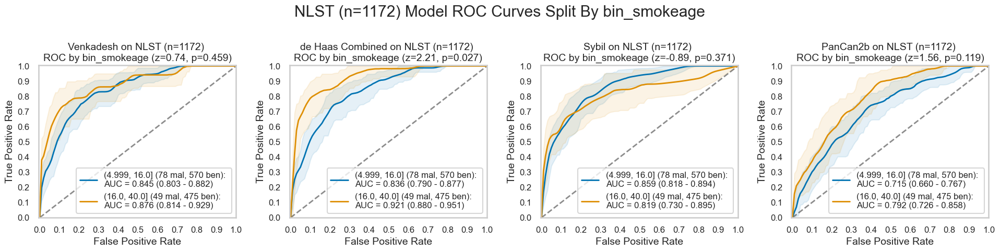

,num,pct,num_mal,pct_mal
"(4.999, 16.0]",648,55.290102,78,12.037037
"(16.0, 40.0]",524,44.709898,49,9.351145


C:\Users\shaur\AppData\Local\Temp\ipykernel_21684\3728513433.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeday  \
                count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                  
(11.999, 25.0]  611.0  0.075286  0.264069  0.0  0.0  0.0  0.0  1.0    611.0   
(25.0, 80.0]    561.0  0.144385  0.351793  0.0  0.0  0.0  0.0  1.0    561.0   

                                                                    
                     mean        std   min   25%   50%   75%   max  
bin_smokeday                                                        
(11.999, 25.0]  20.081833   2.207256  12.0  20.0  20.0  20.0  25.0  
(25.0, 80.0]    38.099822  10.204027  28.0  30.0  40.0  40.0  80.0

#### bin_smokeday

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:318: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


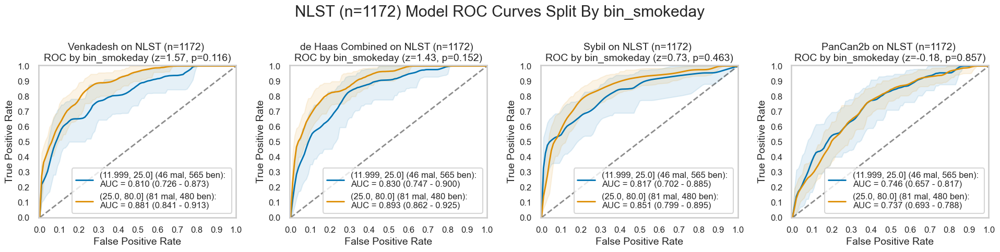

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",611,52.133106,46,7.528642
"(25.0, 80.0]",561,47.866894,81,14.438503


C:\Users\shaur\AppData\Local\Temp\ipykernel_21684\3728513433.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeyr  \
                count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                  
(16.999, 41.0]  603.0  0.077944  0.268305  0.0  0.0  0.0  0.0  1.0   603.0   
(41.0, 65.0]    569.0  0.140598  0.347912  0.0  0.0  0.0  0.0  1.0   569.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                        
(16.999, 41.0]  35.368159  5.119546  17.0  32.0  37.0  40.0  41.0  
(41.0, 65.0]    47.448155  4.416024  42.0  44.0  46.0  50.0  65.0

#### bin_smokeyr

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:318: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


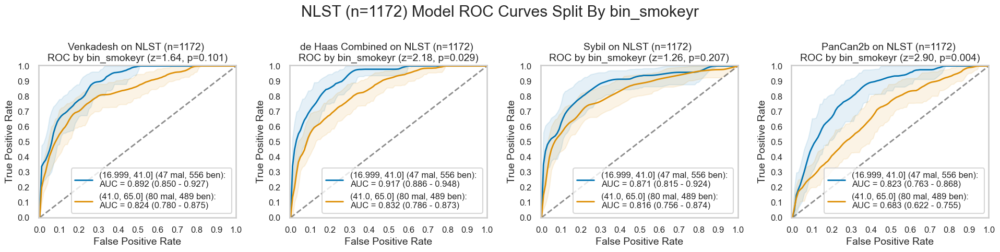

,num,pct,num_mal,pct_mal
"(16.999, 41.0]",603,51.450512,47,7.794362
"(41.0, 65.0]",569,48.549488,80,14.059754


C:\Users\shaur\AppData\Local\Temp\ipykernel_21684\3728513433.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                pkyr  \
                count      mean       std  min  25%  50%  75%  max  count   
bin_pkyr                                                                    
(29.999, 52.0]  601.0  0.063228  0.243575  0.0  0.0  0.0  0.0  1.0  601.0   
(52.0, 224.0]   571.0  0.155867  0.363047  0.0  0.0  0.0  0.0  1.0  571.0   

                                                                     
                     mean        std   min   25%   50%   75%    max  
bin_pkyr                                                             
(29.999, 52.0]  40.953411   6.072504  30.0  36.0  41.0  46.0   52.0  
(52.0, 224.0]   76.194046  21.033603  52.5  60.0  70.0  88.0  224.0

#### bin_pkyr

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:318: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


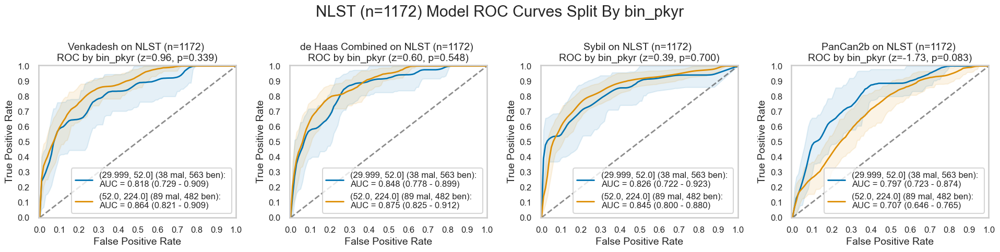

,num,pct,num_mal,pct_mal
"(29.999, 52.0]",601,51.279863,38,6.322795
"(52.0, 224.0]",571,48.720137,89,15.586690


In [36]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

### Included columns from predictions

#### Diameter [mm]

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,8.728517,5.254231,4.0,5.50,7.2,9.8,44.4
1,127.0,15.087402,11.924804,4.2,7.95,11.4,17.6,83.0


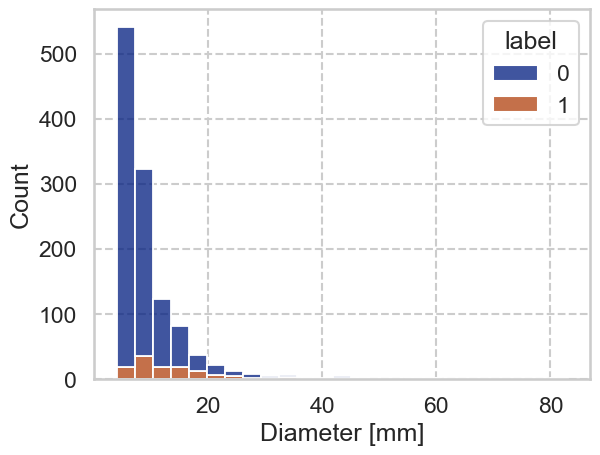

#### NoduleCounts

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,1.814354,1.255633,1.0,1.0,1.0,2.0,11.0
1,127.0,2.448819,1.541534,1.0,2.0,2.0,3.0,10.0


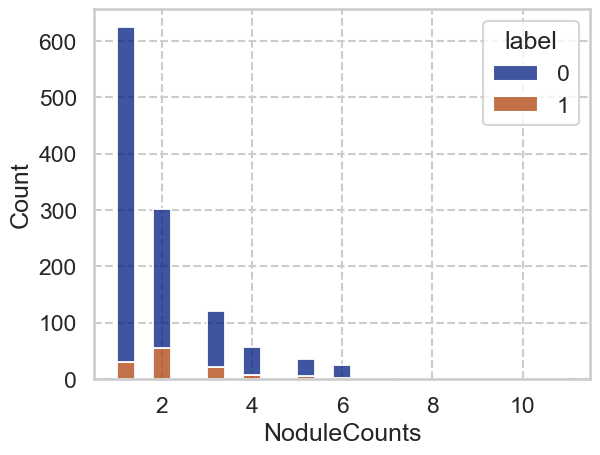

In [37]:
included_num_cols = ["Diameter [mm]", "NoduleCounts"]
for c in included_num_cols:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_21684\3226706664.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_NoduleCounts')[['label', f'NoduleCounts']].describe())


label                                               \
                  count      mean       std  min  25%  50%  75%  max   
bin_NoduleCounts                                                       
(0, 1]            625.0  0.049600  0.217291  0.0  0.0  0.0  0.0  1.0   
(1, 12]           547.0  0.175503  0.380745  0.0  0.0  0.0  0.0  1.0   

                 NoduleCounts                                                
                        count      mean       std  min  25%  50%  75%   max  
bin_NoduleCounts                                                             
(0, 1]                  625.0  1.000000  0.000000  1.0  1.0  1.0  1.0   1.0  
(1, 12]                 547.0  2.892139  1.316725  2.0  2.0  2.0  3.0  11.0

#### bin_NoduleCounts

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:318: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


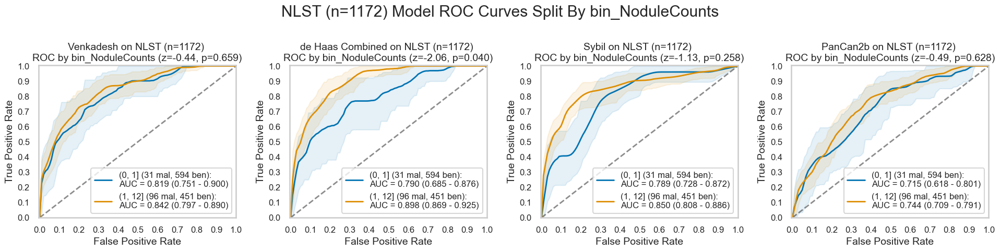

,num,pct,num_mal,pct_mal
"(0, 1]",625,53.327645,31,4.960000
"(1, 12]",547,46.672355,96,17.550274


In [38]:
# for c in included_num_cols:
#     nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, duplicates='drop')
#     display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
#     plot_by_category(nlst_preds, f'bin_{c}')
nlst_preds['bin_NoduleCounts'] = pd.cut(nlst_preds['NoduleCounts'], bins=[0, 1, 12], right=True)
display(nlst_preds.groupby(f'bin_NoduleCounts')[['label', f'NoduleCounts']].describe())
plot_by_category(nlst_preds, f'bin_NoduleCounts')

C:\Users\shaur\AppData\Local\Temp\ipykernel_21684\3128368612.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_Diameter [mm]')[['label', f'Diameter [mm]']].describe())


label                                               \
                   count      mean       std  min  25%  50%  75%  max   
bin_Diameter [mm]                                                       
(3.999, 7.5]       598.0  0.045151  0.207808  0.0  0.0  0.0  0.0  1.0   
(7.5, 83.0]        574.0  0.174216  0.379626  0.0  0.0  0.0  0.0  1.0   

                  Diameter [mm]                                             \
                          count       mean       std  min  25%   50%   75%   
bin_Diameter [mm]                                                            
(3.999, 7.5]              598.0   5.679599  1.016325  4.0  4.8   5.7   6.5   
(7.5, 83.0]               574.0  13.311847  7.662230  7.6  8.8  10.9  14.9   

                         
                    max  
bin_Diameter [mm]        
(3.999, 7.5]        7.5  
(7.5, 83.0]        83.0

#### bin_Diameter [mm]

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:318: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


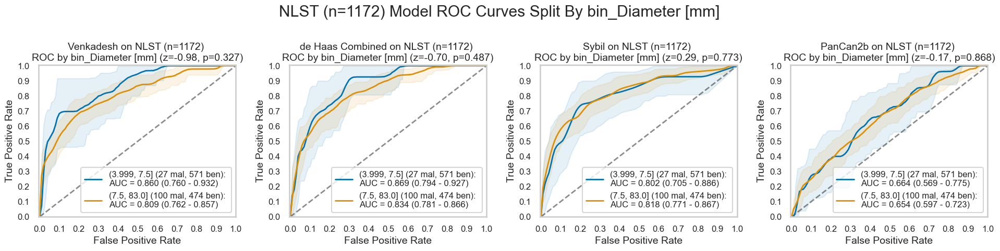

,num,pct,num_mal,pct_mal
"(3.999, 7.5]",598,51.023891,27,4.515050
"(7.5, 83.0]",574,48.976109,100,17.421603


In [39]:
nlst_preds['bin_Diameter [mm]'] = pd.qcut(nlst_preds['Diameter [mm]'], q=2)
display(nlst_preds.groupby(f'bin_Diameter [mm]')[['label', f'Diameter [mm]']].describe())
plot_by_category(nlst_preds, f'bin_Diameter [mm]')